In [16]:
import pandas as pd
from bs4 import BeautifulSoup
import requests
import matplotlib.pyplot as plt

In [5]:
base_url = 'https://www.airlinequality.com/airline-reviews/british-airways'
pages =390
page_size = 100

reviews = []
for i in range(1 , pages+1):
    print(f'Scraping page {i}')

    url = f'{base_url}/page/{i}/?sortby=post_date%3ADesc&page_size={page_size}'

    response = requests.get(url)

    content = response.content
    parsed_content = BeautifulSoup(content,"html.parser")
    for para in parsed_content.find_all("div",{'class':"text_content"}):
        reviews.append(para.get_text())

    print(f" ------> {len(reviews)} total reviews")

Scraping page 1
 ------> 10 total reviews
Scraping page 2
 ------> 20 total reviews
Scraping page 3
 ------> 30 total reviews
Scraping page 4
 ------> 40 total reviews
Scraping page 5
 ------> 50 total reviews
Scraping page 6
 ------> 60 total reviews
Scraping page 7
 ------> 70 total reviews
Scraping page 8
 ------> 80 total reviews
Scraping page 9
 ------> 90 total reviews
Scraping page 10
 ------> 100 total reviews
Scraping page 11
 ------> 110 total reviews
Scraping page 12
 ------> 120 total reviews
Scraping page 13
 ------> 130 total reviews
Scraping page 14
 ------> 140 total reviews
Scraping page 15
 ------> 150 total reviews
Scraping page 16
 ------> 160 total reviews
Scraping page 17
 ------> 170 total reviews
Scraping page 18
 ------> 180 total reviews
Scraping page 19
 ------> 190 total reviews
Scraping page 20
 ------> 200 total reviews
Scraping page 21
 ------> 210 total reviews
Scraping page 22
 ------> 220 total reviews
Scraping page 23
 ------> 230 total reviews
Scrapi

In [3]:
df = pd.DataFrame()
df['reviews'] = reviews
#df['reviews'] = df['reviews'].str[:100]
df.head()

NameError: name 'reviews' is not defined

In [7]:
print(df.iloc[1])

reviews    ✅ Trip Verified | The check in process and rew...
Name: 1, dtype: object


In [8]:
pd.set_option('display.max_colwidth',None)

In [9]:
print(df.iloc[1])

reviews    ✅ Trip Verified | The check in process and reward/loyalty program is a mess. I am never able to get points, even when trying it through a partner airline. Unfortunately for work I have to travel with them sometimes.  This time, the flight was delayed.
Name: 1, dtype: object


In [4]:
df.to_csv('flight_reviews.csv')

In [17]:
data = pd.read_csv('flight_reviews.csv')

In [19]:
data.head()

,Unnamed: 0,reviews
0,0,✅ Trip Verified | British airways lost bags ...
1,1,✅ Trip Verified | The check in process and rew...
2,2,"✅ Trip Verified | We flew in November 2023, ..."
3,3,✅ Trip Verified | I left for London from Johan...
4,4,✅ Trip Verified | After an excellent flight ...


In [20]:
data.columns

Index(['Unnamed: 0', 'reviews'], dtype='object')

In [21]:
data.shape

(3900, 2)

In [22]:
data.drop(columns='Unnamed: 0',axis=1,inplace=True)

In [23]:
data.head()

,reviews
0,✅ Trip Verified | British airways lost bags ...
1,✅ Trip Verified | The check in process and rew...
2,"✅ Trip Verified | We flew in November 2023, ..."
3,✅ Trip Verified | I left for London from Johan...
4,✅ Trip Verified | After an excellent flight ...


# DATA CLEANING AND ANALYSATION

In [24]:
data.iloc[0]

,0
reviews,✅ Trip Verified | British airways lost bags ...


In [25]:
data.shape

(3900, 1)

In [26]:
from wordcloud import WordCloud,STOPWORDS

stopwords = set(STOPWORDS)


In [27]:
text1 = " ".join(review for review in data['reviews'])
print(len(text1))

3513514


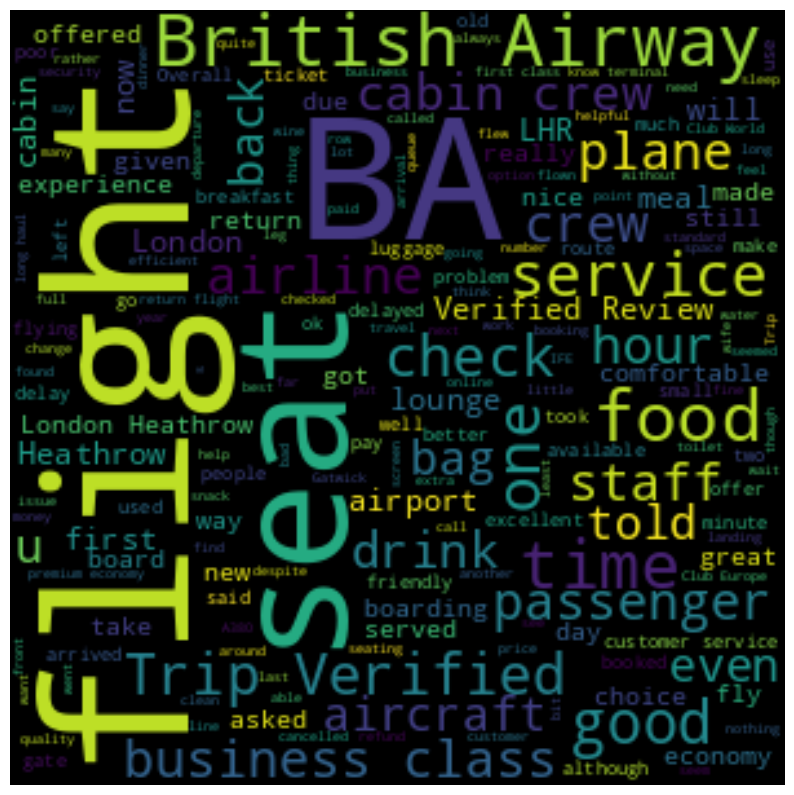

In [28]:
stopwords = set(STOPWORDS)
wordcloud = WordCloud(width=300,height=300,background_color='black').generate(text1)
plt.figure(figsize=(10,15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

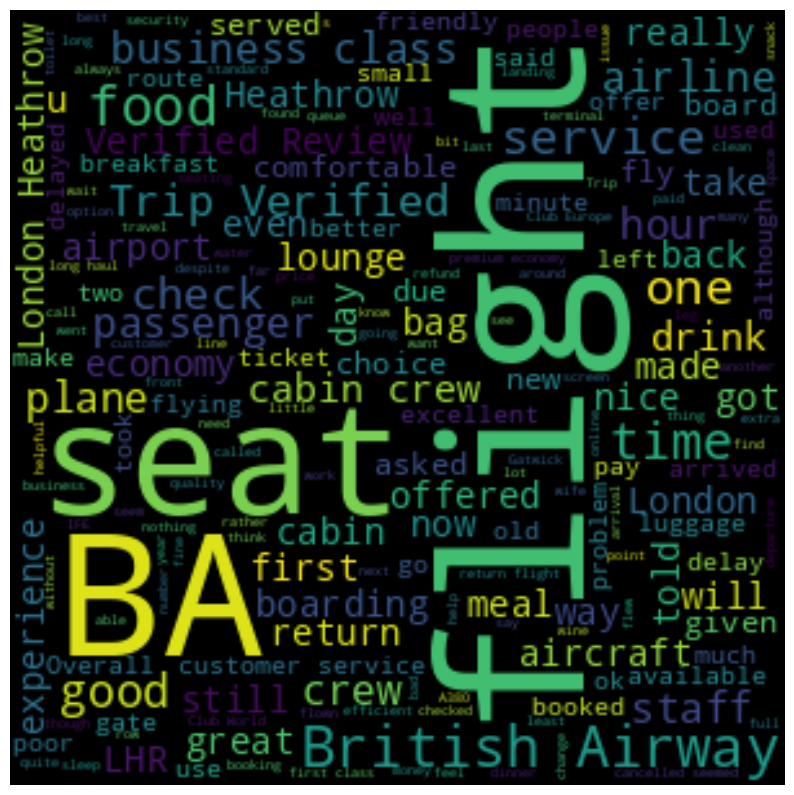

In [29]:
wordcloud = WordCloud(stopwords = stopwords,width=300,height=300,background_color='black').generate(text1)
plt.figure(figsize=(10,15))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [30]:
print(text1)

✅ Trip Verified |   British airways lost bags in LHR then found them. Sent to Cologne where it sat for two days before they told me, but no one was there to give it to me. I spent 10 days in Europe without a bag, bought clothes. BA refused to reimburse me. They closed the case 10 days after i returned to the states when my bag showed up at my front door. They wont let you talk to management, they say they email mail you but they don't then you call customer service. they say they will escalate it but you will never know. they don't update the claims or the forms.  ✅ Trip Verified | The check in process and reward/loyalty program is a mess. I am never able to get points, even when trying it through a partner airline. Unfortunately for work I have to travel with them sometimes.  This time, the flight was delayed. ✅ Trip Verified |   We flew in November 2023, but it took this long to seek a satisfactory response from BA, which we ultimately never received. BA refused to re-book my son and

In [31]:
import re
data['reviews'] = [re.sub(r'^✅ Trip Verified \| ','',review)for review in data['reviews']]
data['reviews'] = [re.sub(r'^✅ Verified Review \| ','',review)for review in data['reviews']]

text = " ".join(review for review in data['reviews'])
print(text)

  British airways lost bags in LHR then found them. Sent to Cologne where it sat for two days before they told me, but no one was there to give it to me. I spent 10 days in Europe without a bag, bought clothes. BA refused to reimburse me. They closed the case 10 days after i returned to the states when my bag showed up at my front door. They wont let you talk to management, they say they email mail you but they don't then you call customer service. they say they will escalate it but you will never know. they don't update the claims or the forms.  The check in process and reward/loyalty program is a mess. I am never able to get points, even when trying it through a partner airline. Unfortunately for work I have to travel with them sometimes.  This time, the flight was delayed.   We flew in November 2023, but it took this long to seek a satisfactory response from BA, which we ultimately never received. BA refused to re-book my son and me at no cost that day due to lack of Underground ser

In [32]:
data.head()

,reviews
0,British airways lost bags in LHR then found ...
1,The check in process and reward/loyalty progra...
2,"We flew in November 2023, but it took this l..."
3,I left for London from Johannesburg at 21:15 o...
4,After an excellent flight on a 777 CPT to LH...


In [33]:
print(text)

  British airways lost bags in LHR then found them. Sent to Cologne where it sat for two days before they told me, but no one was there to give it to me. I spent 10 days in Europe without a bag, bought clothes. BA refused to reimburse me. They closed the case 10 days after i returned to the states when my bag showed up at my front door. They wont let you talk to management, they say they email mail you but they don't then you call customer service. they say they will escalate it but you will never know. they don't update the claims or the forms.  The check in process and reward/loyalty program is a mess. I am never able to get points, even when trying it through a partner airline. Unfortunately for work I have to travel with them sometimes.  This time, the flight was delayed.   We flew in November 2023, but it took this long to seek a satisfactory response from BA, which we ultimately never received. BA refused to re-book my son and me at no cost that day due to lack of Underground ser

In [34]:
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

In [35]:
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [36]:
sia = SentimentIntensityAnalyzer()
print(sia.polarity_scores("Such a pretty weather!")['compound'])

0.5411


In [37]:
def score(text):
  s = sia.polarity_scores(text)['compound']
  return(s)

data['Sentiment_score'] = data['reviews'].apply(score)
data.head()

,reviews,Sentiment_score
0,British airways lost bags in LHR then found ...,-0.7391
1,The check in process and reward/loyalty progra...,-0.7003
2,"We flew in November 2023, but it took this l...",-0.6820
3,I left for London from Johannesburg at 21:15 o...,-0.9353
4,After an excellent flight on a 777 CPT to LH...,0.9839


In [38]:
data_above0 = data[data['Sentiment_score']>0]

In [39]:
data_above0.shape[0]

2248

In [40]:
data_below0 = data[data['Sentiment_score']<0]

In [41]:
data_below0.shape[0]

1641

In [42]:
data_equal0 = data[data['Sentiment_score']==0]

In [43]:
data_equal0.shape[0]

11

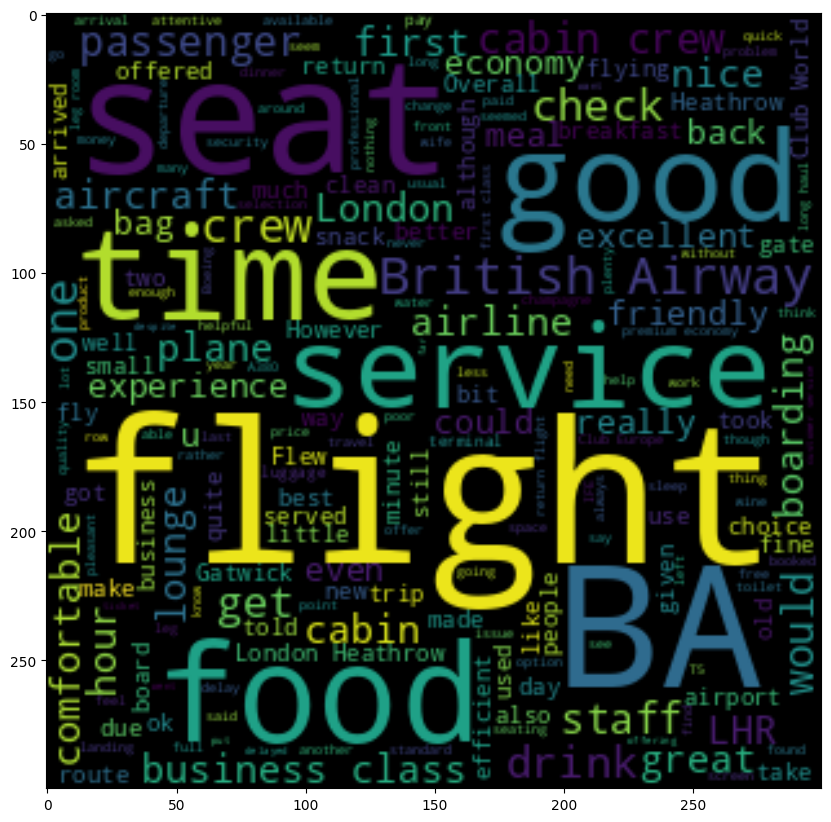

In [94]:
text_above0 = " ".join(review for review in data_above0['reviews'])
wordcloud_above0 = WordCloud(stopwords = stop_words,width=300,height=300,background_color='black').generate(text_above0)
plt.figure(figsize=(10,15))
plt.imshow(wordcloud_above0, interpolation= 'bilinear')
plt.show()

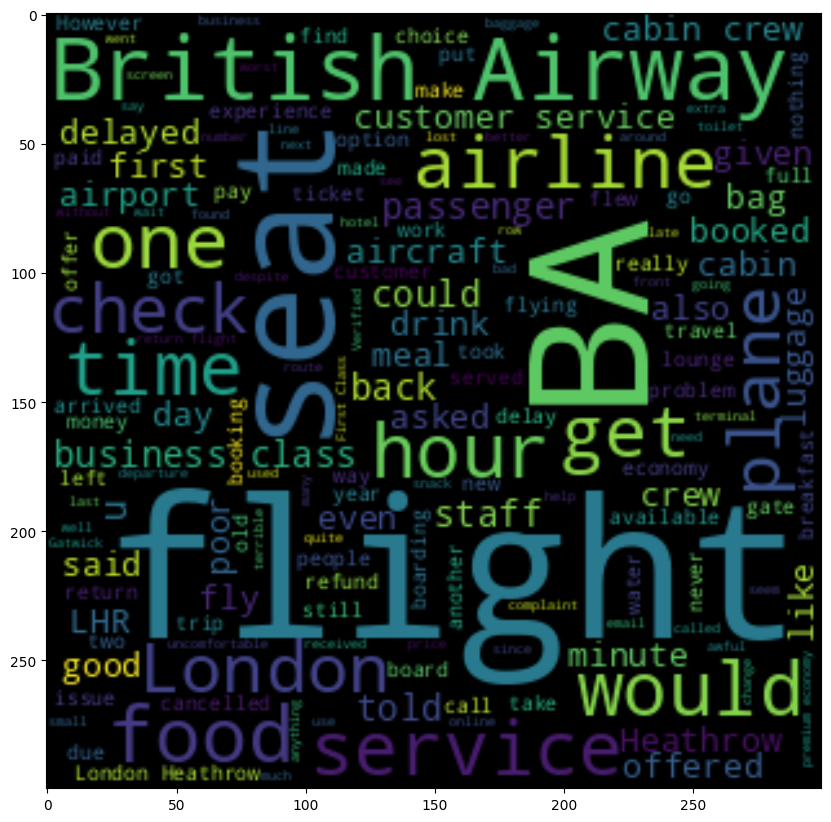

In [92]:
text_below0 = " ".join(review for review in data_below0['reviews'])
wordcloud_below0 = WordCloud(stopwords = stop_words,width=300,height=300,background_color='black').generate(text_below0)
plt.figure(figsize=(10,15))
plt.imshow(wordcloud_below0, interpolation= 'bilinear')
plt.axis= 'off'
plt.show()

In [46]:
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(max_df=0.98, min_df=2, stop_words='english')
x = cv.fit_transform(data_above0['reviews'])
x
#cv.get_feature_names_out()

<2248x6200 sparse matrix of type '<class 'numpy.int64'>'
	with 136386 stored elements in Compressed Sparse Row format>

In [47]:
from sklearn.decomposition import LatentDirichletAllocation
lda = LatentDirichletAllocation(n_components= 3, random_state=42)
lda.fit(x)

LatentDirichletAllocation(n_components=3, random_state=42)

In [48]:
len(cv.get_feature_names_out())

6200

In [49]:
type(cv.get_feature_names_out())

numpy.ndarray

In [50]:
cv.get_feature_names_out()[500]

'angle'

In [51]:
import random

for i in range(10):
  random_word_id = random.randint(0,1209)
  print(cv.get_feature_names_out()[random_word_id])

brilliant
caramel
body
caterer
19th
80
additionally
carpet
banana
charity


In [52]:
lda.components_.shape

(3, 6200)

In [53]:
lda.components_

array([[19.74776561,  5.50539279,  1.33553365, ...,  0.36550663,
         0.47095596, 12.07909246],
       [ 4.46547669,  0.39410192,  0.33359745, ...,  0.36821529,
         0.33411043,  3.43754153],
       [ 2.7867577 ,  9.10050528,  2.3308689 , ...,  6.26627807,
        10.19493361,  0.48336601]])

In [54]:
single_topic = lda.components_[0]

single_topic.argsort()

array([2018, 1181, 5055, ..., 3365,  705, 2400])

In [55]:
single_topic[2402]

237.3077762045903

In [56]:
single_topic[881]

0.4912218228365094

In [57]:
indexes = single_topic.argsort()[-10:]

In [58]:
for i in indexes:
  print(cv.get_feature_names_out()[i])

staff
heathrow
time
service
check
airways
british
london
ba
flight


In [59]:
for i,topic in enumerate(lda.components_):
  print(f'The top 15 words for topic {i}:')
  print([cv.get_feature_names_out()[i] for i in topic.argsort()[-10:]])
  print('\n')

The top 15 words for topic 0:
['staff', 'heathrow', 'time', 'service', 'check', 'airways', 'british', 'london', 'ba', 'flight']


The top 15 words for topic 1:
['food', 'london', 'flight', 'seat', 'service', 'business', 'airways', 'british', 'class', 'ba']


The top 15 words for topic 2:
['seats', 'time', 'seat', 'cabin', 'service', 'crew', 'food', 'ba', 'good', 'flight']




In [60]:
x2 = cv.fit_transform(data_below0['reviews'])
x

<2248x6200 sparse matrix of type '<class 'numpy.int64'>'
	with 136386 stored elements in Compressed Sparse Row format>

In [61]:
lda2 = LatentDirichletAllocation(n_components= 8, random_state=42)
lda2.fit(x2)

LatentDirichletAllocation(n_components=8, random_state=42)

In [62]:
lda2.components_.shape

(8, 5536)

In [63]:
for i , topic in enumerate(lda2.components_):
  print(f'Top 10 words of topic {i}: ')
  print([cv.get_feature_names_out()[i] for i in topic.argsort()[-20:]])
  print('\n')

Top 10 words of topic 0: 
['check', 'experience', 'fly', 'customer', 'time', 'heathrow', 'airlines', 'seats', 'cabin', 'staff', 'crew', 'plane', 'london', 'airline', 'seat', 'service', 'flight', 'british', 'airways', 'ba']


Top 10 words of topic 1: 
['british', 'drink', 'check', 'cabin', 'hours', 'served', 'airlines', 'asked', 'poor', 'airline', 'economy', 'london', 'meal', 'food', 'service', 'staff', 'seat', 'return', 'ba', 'flight']


Top 10 words of topic 2: 
['return', 'poor', 'passengers', 'airline', 'crew', 'heathrow', 'premium', 'cabin', 'london', 'service', 'airways', 'british', 'food', 'economy', 'business', 'seats', 'ba', 'flight', 'seat', 'class']


Top 10 words of topic 3: 
['poor', 'staff', 'bag', 'airline', 'airlines', 'lhr', 'return', 'time', 'passengers', 'seat', 'did', 'just', 'crew', 'service', 'food', 'cabin', 'business', 'class', 'ba', 'flight']


Top 10 words of topic 4: 
['refund', 'check', 'flights', 'delayed', 'did', 'booked', 'heathrow', 'day', 'cancelled', 't

In [64]:
!pip install pyLDAvis

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 22.1 MB/s eta 0:00:00


In [82]:
nltk.download('stopwords')
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))
filtered_words = [word for word in ' '.join(data_below0['reviews']).lower().split() if word not in stop_words]

freq_words = pd.Series(filtered_words).value_counts()[:20]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [83]:
freq_words

,count
flight,2604
ba,1943
british,1116
-,1018
service,925
airways,863
seat,799
london,791
would,785
one,761


<ipython-input-89-3021747ca3ad>:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  freq_words.plot.barh(x = freq_words[0],y= freq_words[1],color='#D20A2E')


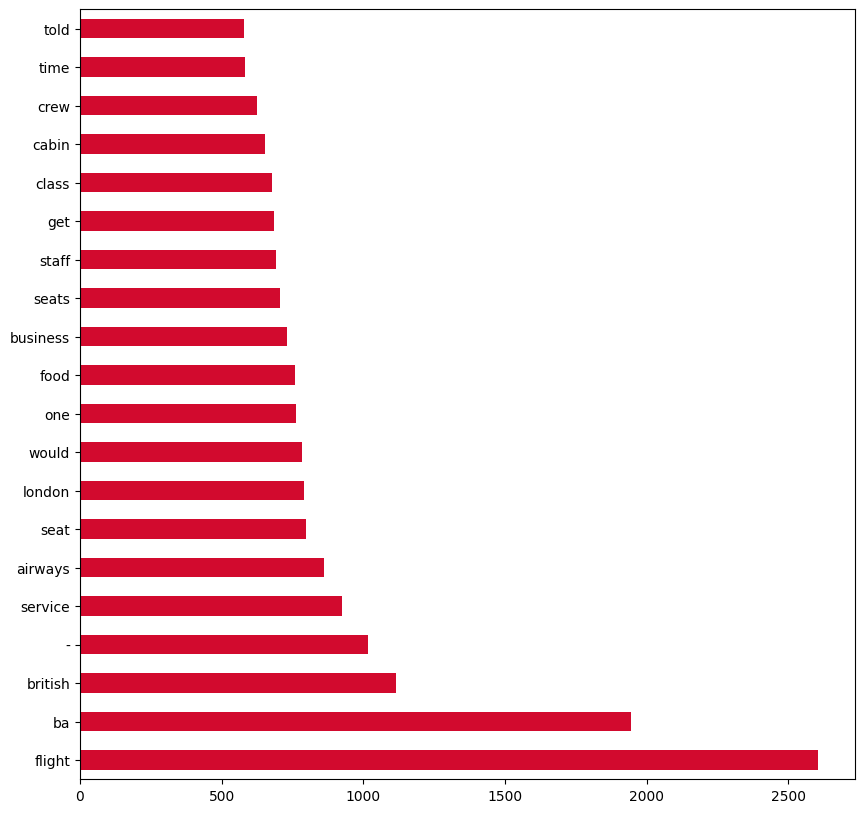

In [89]:
plt.figure(figsize=(10,10))
freq_words.plot.barh(x = freq_words[0],y= freq_words[1],color='#D20A2E')
plt.show()

In [98]:
data_below0.shape[0]

1641

In [96]:
data_above0.shape[0]

2248

In [97]:
data_equal0.shape[0]

11

In [99]:
data.shape[0]

3900

57.6% -> Positive reviews

42% -> Negative reviews

0.3% -> Neutral reviews